# ZFNet

In this notebook we will be implementing a modified version of [ZFNet](https://arxiv.org/abs/1311.2901), a neural network model that uses convolutional neural network (CNN) layers and was designed for the [ImageNet challenge](http://www.image-net.org/challenges/LSVRC/). ZFNet is famous for winning the ImageNet challenge in 2013 by beating the second place competitor by over 10% accuracy and kickstarting the interest in deep learning for computer vision.

The image below shows the architecture of ZFNet.

![](./assets/ZFNet.png)

We will also show how to initialize the weights of our neural network and how to find a suitable learning rate using a modified version of the [learning rate finder](https://arxiv.org/abs/1506.01186).

Like the previous notebooks we'll implement our model, measure its performance on the dataset, and then have a short look into seeing what the model has learned.

Most of this notebook will be similar to the previous ones thus we will skim over code that has been shown before. We can look at the previous notebook for a refresher if needed.

### Data Processing

As always, we'll import the modules we need. A new import is the `_LRScheduler` which we will use to implement our learning rate finder.

In [68]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchsummary import summary
from zipfile import ZipFile
import urllib.request
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image
from collections import OrderedDict
from classes import class_names
from utils import *

import torch.optim as optim
import torch.optim.lr_scheduler as lr_scheduler
from torch.optim.lr_scheduler import _LRScheduler
import torch.utils.data as data
import torchvision.datasets as datasets
from torchvision import models

from sklearn import decomposition
from sklearn import manifold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from tqdm.notebook import tqdm, trange

import numpy as np
import os, cv2, copy, time, shutil, random

We set the random seed so all of our experiments can be reproduced.

In [18]:
SEED = 1234

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

We'll be using our own dataset instead of using one provided by `torchvision.datasets`.

The url of the CUB200-2011 dataset can be found on its [website](http://www.vision.caltech.edu/visipedia/CUB-200-2011.html). However, the dataset is now hosted on Google Drive which has problems with files exceeding their download quota. 

Instead, we'll download the dataset from [Kaggle](https://www.kaggle.com) using the [kaggle-api](https://github.com/Kaggle/kaggle-api) which needs to be installed with `pip install kaggle`.

First, we need to have a Kaggle account in order to generate an API key. Once we're logged on to Kaggle, we need to go to `https://www.kaggle.com/<username>/account` and click `Generate New API Token` which will download a `kaggle.json` file. Place this at `~/.kaggle/kaggle.json` (or, if you're on Windows, at `C:\Users\<Windows-username>\.kaggle\kaggle.json`). 

If we are using Google Colab, an alternative is simply set the environment variables `KAGGLE_USERNAME` and `KAGGLE_KEY` to their respective values. This is what we do below.

Next, we'll download the dataset from where it is hosted on Kaggle, at: https://www.kaggle.com/veeralakrishna/200-bird-species-with-11788-images. This is done with `!kaggle datasets download <kaggle-url> --unzip`, where the `<kaggle-url>` is the dataset URL after the `kaggle.com` part, which is `veeralakrishna/200-bird-species-with-11788-images` for this dataset.

[`datasets.utils`](https://github.com/pytorch/vision/blob/master/torchvision/datasets/utils.py) contains some functionality for downloading and extract data which means we don't have to write it ourselves.

We use the `extract_archive` function, which extracts a file to a given root folder. We should now have a `./../data/CUB_200_2011` folder which contains our entire dataset.

Put `CUB_200_2011.tgz` to `./../data` directory.

In [19]:
# REPLACE THESE WITH YOUR OWN KAGGLE USERNAME AND KEY
#os.environ['KAGGLE_USERNAME'] = 'YOUR_KAGGLE_USERNAME_HERE'
#os.environ['KAGGLE_KEY'] = 'YOUR_KAGGLE_KEY_HERE'

#!pip install kaggle
#!kaggle datasets download veeralakrishna/200-bird-species-with-11788-images --unzip

ROOT = './../data'

datasets.utils.extract_archive('./../data/CUB_200_2011.tgz', ROOT)

'./../data'

To handle using custom datasets, torchvision provides a [`datasets.ImageFolder`](https://pytorch.org/vision/stable/datasets.html#torchvision.datasets.ImageFolder) class. 

`ImageFolder` expects data to be stored in the following way:

```
root/class_x/xxy.png
root/class_x/xxz.jpg

root/class_y/123.jpeg
root/class_y/nsdf3.png
root/class_y/asd932_.jpg
```

That is, each folder in the root directory is the name of a class, and within each of those folders are the images that correspond to that class. The images in the downloaded dataset are currently in the form of:

```
CUB_200_2011/images/class_a/image_1.jpg
CUB_200_2011/images/class_a/image_2.jpg

CUB_200_2011/images/class_b/image_1.jpg
CUB_200_2011/images/class_b/image_2.jpg

CUB_200_2011/images/class_c/image_1.jpg
CUB_200_2011/images/class_c/image_2.jpg
```

This means we could call `datasets.ImageFolder(root = './../data/CUB_200_2011/images)` and it would load all of the data. However, we want to split our data into train and test splits. This could be done with `data.random_split`, which we have used in the past to create our validation sets - but we will show how to manually create a `train` and `test` folder and store the relevant images in those folders. This way means that we only need to create a train/test split once and re-use it each time we re-run the notebook

We first set a `TRAIN_RATIO` which will decide what percentage of the images per class are used to make up the training set, with the remainder making up the test set. We create a `train` and `test` folder within the `CUB_200_2011` folder - after first deleting them if they already exist. Then, we get a list of all classes and loop through each class. For each class we get the image names, use the first `TRAIN_RATIO` of them for the training set and the remainder for the test set. We then copy - with `shutil.copyfile` - each of the images into their respective `train` or `test` folder. It is usually better to copy, rather than move, the images to create your custom splits just in case we accidentally mess up somewhere.

After running the below cell we have our training set as:

```
CUB_200_2011/images/train/class_a/image_1.jpg
CUB_200_2011/images/train/class_a/image_2.jpg

CUB_200_2011/images/train/class_b/image_1.jpg
CUB_200_2011/images/train/class_b/image_2.jpg

CUB_200_2011/images/train/class_b/image_1.jpg
CUB_200_2011/images/train/class_b/image_2.jpg
```

and our test set as:

```
CUB_200_2011/images/test/class_a/image_48.jpg
CUB_200_2011/images/test/class_a/image_49.jpg

CUB_200_2011/images/test/class_b/image_48.jpg
CUB_200_2011/images/test/class_b/image_49.jpg

CUB_200_2011/images/test/class_c/image_48.jpg
CUB_200_2011/images/test/class_c/image_49.jpg
```

<font color=red>This train/test split only needs to be created once and does not need to be created again on subsequent runs.</font>

**Note:** `ImageFolder` will only load files that have image related extensions, i.e. jpg/jpeg/png, so if there was, for example, a `.txt` file in one of the class folders then it would not be loaded with the images. If we wanted more flexibility when deciding which files to load or not - such as not loading .png images or loading images with an esoteric format - then we could either use the `is_valid_file` argument of the `ImageFolder` class or use [`DatasetFolder`](https://pytorch.org/vision/stable/datasets.html#torchvision.datasets.DatasetFolder) and provide a list of valid extensions to the `extensions` argument.

In [20]:
TRAIN_RATIO = 0.8

data_dir = os.path.join(ROOT, 'CUB_200_2011')
images_dir = os.path.join(data_dir, 'images')
train_dir = os.path.join(data_dir, 'train')
test_dir = os.path.join(data_dir, 'test')

if os.path.exists(train_dir):
    shutil.rmtree(train_dir) 
if os.path.exists(test_dir):
    shutil.rmtree(test_dir)
    
os.makedirs(train_dir)
os.makedirs(test_dir)

classes = os.listdir(images_dir)

for c in classes:
    class_dir = os.path.join(images_dir, c)
    
    images = os.listdir(class_dir)
       
    n_train = int(len(images) * TRAIN_RATIO)
    
    train_images = images[:n_train]
    test_images = images[n_train:]
    
    os.makedirs(os.path.join(train_dir, c), exist_ok = True)
    os.makedirs(os.path.join(test_dir, c), exist_ok = True)
    
    for image in train_images:
        image_src = os.path.join(class_dir, image)
        image_dst = os.path.join(train_dir, c, image) 
        shutil.copyfile(image_src, image_dst)
        
    for image in test_images:
        image_src = os.path.join(class_dir, image)
        image_dst = os.path.join(test_dir, c, image) 
        shutil.copyfile(image_src, image_dst)

Now we've got our train/test splits we can go ahead and calculate the mean and standard deviation (std) of our dataset to normalize it. We're actually going to use a pre-trained model in this notebook so will be using the mean and std desired by the pre-trained data, so we don't actually have to calculate this - however it is left as an example.

Calculating the mean and std is slightly different than when using a dataset provided by torchvision as those datasets have all of the images stored as numpy arrays in the data's `data` attribute, whilst datasets loaded by `ImageFolder` and `DataFolder` do not.

First, we load the `train_data` from the `train` folder. Remember: the mean and std must only be calculated from the training data. This will load PIL images by default so we pass the `ToTensor` transform which converts all the PIL images to tensors and scales them from 0-255 to 0-1.

We then loop through each image and calculate the mean and std across the height and width dimensions with `dim = (1,2)`, summing all the means and stds and then finding the average by dividing them by the number of examples, `len(train_data)`.

Again, this only needs to be calculated once per dataset and the means and stds calculated here can be re-used without calculating them for other runs. The exception to this is if we used a different train/test split, then we would need to calculate these again.

In [21]:
train_data = datasets.ImageFolder(root = train_dir, 
                                  transform = transforms.ToTensor())

means = torch.zeros(3)
stds = torch.zeros(3)

for img, label in train_data:
    means += torch.mean(img, dim = (1,2))
    stds += torch.std(img, dim = (1,2))

means /= len(train_data)
stds /= len(train_data)
    
print(f'Calculated means: {means}')
print(f'Calculated stds: {stds}')

Calculated means: tensor([0.4866, 0.4999, 0.4316])
Calculated stds: tensor([0.1824, 0.1813, 0.1931])


Now to actually load our data. As we are going to be using a pre-trained model we will need to ensure that our images are the same size and have the same normalization as those used to train the model - which we find on the torchvision [models](https://pytorch.org/vision/stable/models.html) page.

We use the same data augmentation as always: randomly rotating, flipping horizontally and cropping.

In [22]:
pretrained_size = 224
pretrained_means = [0.485, 0.456, 0.406]
pretrained_stds= [0.229, 0.224, 0.225]

train_transforms = transforms.Compose([
                           transforms.Resize(pretrained_size),
                           transforms.RandomRotation(5),
                           transforms.RandomHorizontalFlip(0.5),
                           transforms.RandomCrop(pretrained_size, padding = 10),
                           transforms.ToTensor(),
                           transforms.Normalize(mean = pretrained_means, 
                                                std = pretrained_stds)
                       ])

test_transforms = transforms.Compose([
                           transforms.Resize(pretrained_size),
                           transforms.CenterCrop(pretrained_size),
                           transforms.ToTensor(),
                           transforms.Normalize(mean = pretrained_means, 
                                                std = pretrained_stds)
                       ])

We load our data with our transforms...

In [23]:
train_data = datasets.ImageFolder(root = train_dir, 
                                  transform = train_transforms)

test_data = datasets.ImageFolder(root = test_dir, 
                                 transform = test_transforms)

...create the validation split...

In [24]:
VALID_RATIO = 0.9

n_train_examples = int(len(train_data) * VALID_RATIO)
n_valid_examples = len(train_data) - n_train_examples

train_data, valid_data = data.random_split(train_data, 
                                           [n_train_examples, n_valid_examples])

...and then overwrite the validation transforms, making sure to do a `deepcopy` to stop this also changing the training data transforms.

In [25]:
valid_data = copy.deepcopy(valid_data)
valid_data.dataset.transform = test_transforms

To make sure nothing has messed up we'll print the number of examples in each of the data splits - ensuring they add up to the number of examples indicated on the [CUB200-2011 dataset website](http://www.vision.caltech.edu/visipedia/CUB-200-2011.html) (11,788).

In [27]:
print(f'Number of training examples: {len(train_data)}')
print(f'Number of validation examples: {len(valid_data)}')
print(f'Number of testing examples: {len(test_data)}')
print("--------------------------------")
print(f'Number of total examples: {len(train_data) + len(valid_data) + len(test_data)}')

Number of training examples: 8472
Number of validation examples: 942
Number of testing examples: 2374
--------------------------------
Number of total examples: 11788


Next, we'll create the iterators with the largest batch size that fits on our GPU. 

In [28]:
BATCH_SIZE = 64

train_iterator = data.DataLoader(train_data, 
                                 shuffle = True, 
                                 batch_size = BATCH_SIZE)

valid_iterator = data.DataLoader(valid_data, 
                                 batch_size = BATCH_SIZE)

test_iterator = data.DataLoader(test_data, 
                                batch_size = BATCH_SIZE)

To ensure the images have been processed correctly we can plot a few of them - ensuring we re-normalize the images so their colors look right.

In [29]:
def normalize_image(image):
    image_min = image.min()
    image_max = image.max()
    image.clamp_(min = image_min, max = image_max)
    image.add_(-image_min).div_(image_max - image_min + 1e-5)
    return image

In [30]:
def plot_images(images, labels, classes, normalize = True):
    n_images = len(images)

    rows = int(np.sqrt(n_images))
    cols = int(np.sqrt(n_images))

    fig = plt.figure(figsize = (15, 15))

    for i in range(rows*cols):
        ax = fig.add_subplot(rows, cols, i+1)
        
        image = images[i]

        if normalize:
            image = normalize_image(image)

        ax.imshow(image.permute(1, 2, 0).cpu().numpy())
        label = classes[labels[i]]
        ax.set_title(label)
        ax.axis('off')

We can see the images look fine, however the names of the classes provided by the folders containing the images are a little long and sometimes overlap with neighbouring images.

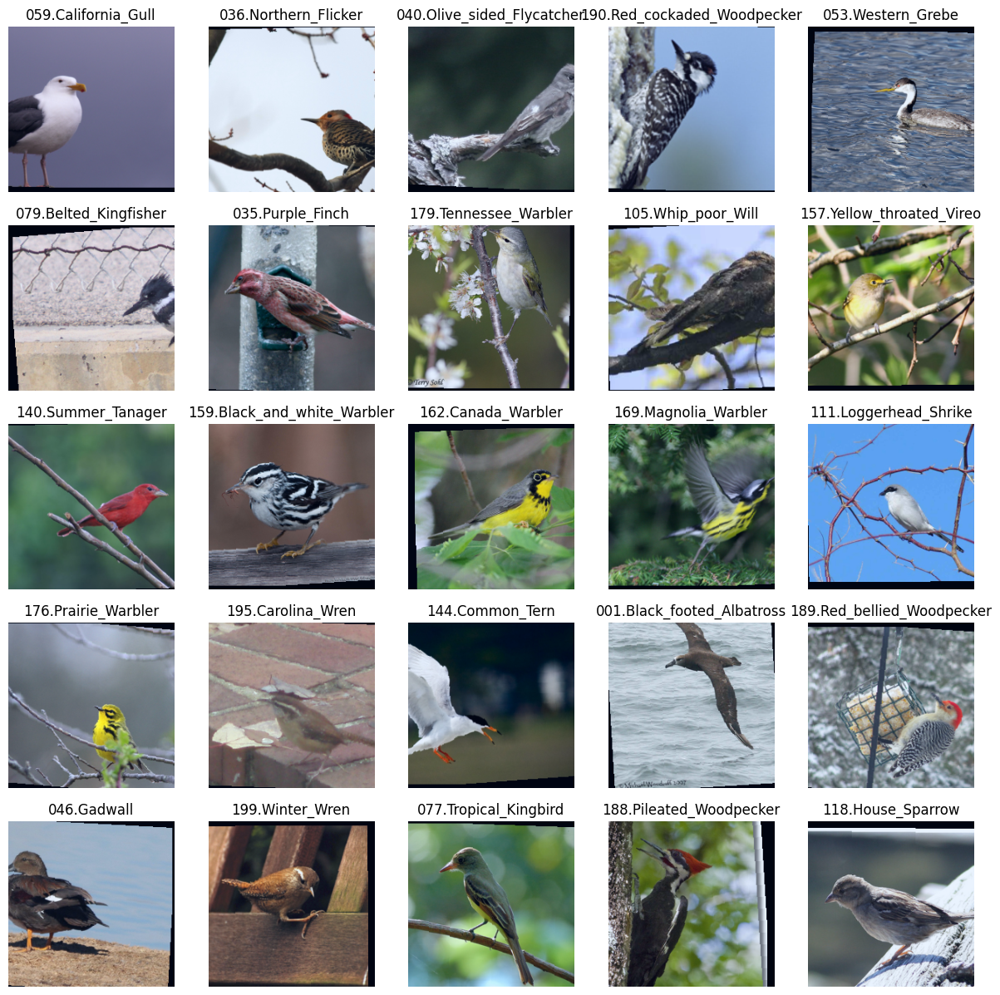

In [31]:
N_IMAGES = 25

images, labels = zip(*[(image, label) for image, label in 
                           [train_data[i] for i in range(N_IMAGES)]])

classes = test_data.classes

plot_images(images, labels, classes)

One way to solve the issue with the names of the classes would have been to manually change the names of the folders before we copied them over into the `train` and `test` folders. 

Another approach is to directly change the names of each class provided by the dataset's `.classes`. We'll make a `format_label` function which will strip off the number at the start of each class and convert them into title case.

In [33]:
def format_label(label):
    label = label.split('.')[-1]
    label = label.replace('_', ' ')
    label = label.title()
    label = label.replace(' ', '')
    return label

Let's change the class names and re-plot the images with their new class names.

No more overlapping!

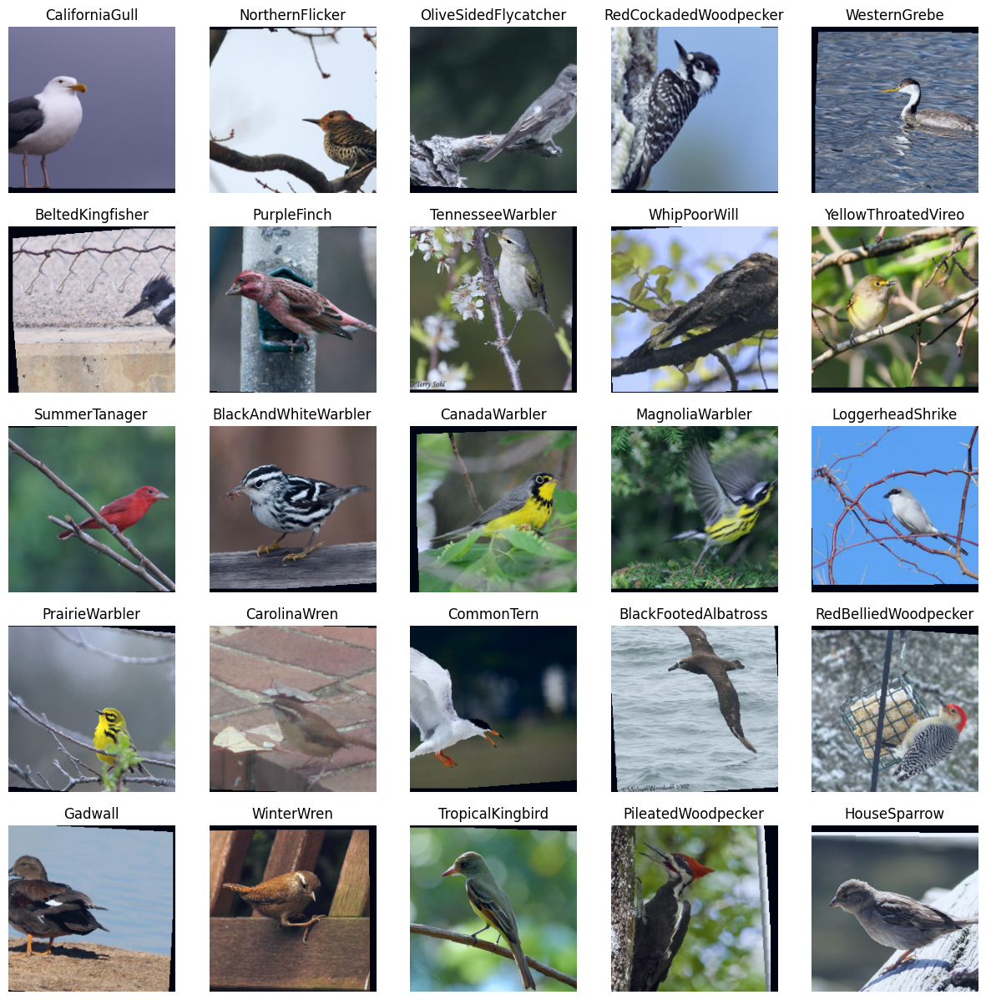

In [34]:
test_data.classes = [format_label(c) for c in test_data.classes]

classes = test_data.classes

plot_images(images, labels, classes)

### Defining the Model

Next up is defining the model.

The actual model itself is no more difficult to understand than the previous model, LeNet. It is made up of convolutional layers, pooling layers and ReLU activation functions. See the previous notebook for a refresher on these concepts. 

There are only two new concepts introduced here, `nn.Sequential` and `nn.Dropout`.

We can think of `Sequential` as like our transforms introduced earlier for data augmentation. We provide `Sequential` with multiple layers and when the `Sequential` module is called it will apply each layer, in order, to the input. There is no difference between using a `Sequential` and having each module defined in the `__init__` and then called in `forward` - however it makes the code significantly shorter.

We have one `Sequential` model, `features`, for all the convolutional and pooling layers, then we flatten then data and pass it to the `classifier`, another `Sequential` model which is made up of linear layers and the second new concept, *dropout*.

Dropout is a form of [*regularization*](https://en.wikipedia.org/wiki/Regularization_(mathematics)). As our models get larger, to perform more accurately on richer datasets, they start having a significantly higher number of parameters. The problem with lots of parameters is that our models begin to *overfit*. That is, they do not learn general image features whilst learning to classify images but instead simply memorize images within the training set. This is bad as it will cause our model to achieve poor performance on the validation/testing set. To solve this overfitting problem, we use regularization. Dropout is just one method of regularization, other common ones are *L1 regularization*, *L2 regularization* and *weight decay*.

Dropout works by randomly setting a certain fraction, 0.5 here, of the neurons in a layer to zero. This effectively adds noise to the training of the neural network and causes neurons to learn with "less" data as they are only getting half of the information from a previous layer with dropout applied. It can also be thought of as causing your model to learn multiple smaller models with less parameters. 

Dropout is only applied when the model is training. It needs to be "turned off" when validating, testing or using the model for inference.

As mentioned in the previous notebook, during the convolutional and pooling layers the activation function should be placed **after** the pooling layer to reduce computational cost.

In the linear layers, dropout should be applied **after** the activation function. Although when using ReLU activation functions the same result is achieved if dropout is before or after, see [here](https://sebastianraschka.com/faq/docs/dropout-activation.html).

One last thing to mention is that the very first convolutional layer has an `in_channel` of three. That is because we are handling color images that have three channels (red, green and blue) instead of the single channel grayscale images from the MNIST dataset. This doesn't change the way any of the convolutional filter works, it just means the first filter has a depth of three instead of a depth of one.

In [35]:
class ZFNet(nn.Module):
    def __init__(self, output_dim):
        super(ZFNet, self).__init__()
        # CONV PART.
        self.features = nn.Sequential(OrderedDict([
            ('conv1', nn.Conv2d(3, 96, kernel_size=7, stride=2, padding=1)),
            ('act1', nn.ReLU()),
            ('pool1', nn.MaxPool2d(kernel_size=3, stride=2, padding=1, return_indices=True)),
            ('conv2', nn.Conv2d(96, 256, kernel_size=5, stride=2, padding=0)),
            ('act2', nn.ReLU()),
            ('pool2', nn.MaxPool2d(kernel_size=3, stride=2, padding=1, return_indices=True)),
            ('conv3', nn.Conv2d(256, 384, kernel_size=3, stride=1, padding=1)),
            ('act3', nn.ReLU()),
            ('conv4', nn.Conv2d(384, 384, kernel_size=3, stride=1, padding=1)),
            ('act4', nn.ReLU()),
            ('conv5', nn.Conv2d(384, 256, kernel_size=3, stride=1, padding=1)),
            ('act5', nn.ReLU()),
            ('pool5', nn.MaxPool2d(kernel_size=3, stride=2, padding=0, return_indices=True))
        ]))
    
        self.feature_outputs = [0]*len(self.features)
        self.switch_indices = dict()
        self.sizes = dict()

        self.classifier = nn.Sequential(OrderedDict([
            ('fc6', nn.Linear(9216, 4096)),
            ('act6', nn.ReLU()),
            ('fc7', nn.Linear(4096, 4096)),
            ('act7', nn.ReLU()),
            ('fc8', nn.Linear(4096, output_dim))
        ]))
    
        # DECONV PART.
        self.deconv_pool5 = nn.MaxUnpool2d(kernel_size=3,
                                           stride=2,
                                           padding=0)
        self.deconv_act5 = nn.ReLU()
        self.deconv_conv5 = nn.ConvTranspose2d(256,
                                               384,
                                               kernel_size=3,
                                               stride=1,
                                               padding=1,
                                               bias=False)
        
        self.deconv_act4 = nn.ReLU()
        self.deconv_conv4 = nn.ConvTranspose2d(384,
                                               384,
                                               kernel_size=3,
                                               stride=1,
                                               padding=1,
                                               bias=False)
        
        self.deconv_act3 = nn.ReLU()
        self.deconv_conv3 = nn.ConvTranspose2d(384,
                                               256,
                                               kernel_size=3,
                                               stride=1,
                                               padding=1,
                                               bias=False)
        
        self.deconv_pool2 = nn.MaxUnpool2d(kernel_size=3,
                                           stride=2,
                                           padding=1)
        self.deconv_act2 = nn.ReLU()
        self.deconv_conv2 = nn.ConvTranspose2d(256,
                                               96,
                                               kernel_size=5,
                                               stride=2,
                                               padding=0,
                                               bias=False)
        
        self.deconv_pool1 = nn.MaxUnpool2d(kernel_size=3,
                                           stride=2,
                                           padding=1)
        self.deconv_act1 = nn.ReLU()
        self.deconv_conv1 = nn.ConvTranspose2d(96,
                                               3,
                                               kernel_size=7,
                                               stride=2,
                                               padding=1,
                                               bias=False)

    def forward(self, x):
        for i, layer in enumerate(self.features):
            if isinstance(layer, nn.MaxPool2d):
                x, indices = layer(x)
                self.feature_outputs[i] = x
                self.switch_indices[i] = indices
            else:
                x = layer(x)
                self.feature_outputs[i] = x
            
        h = x.view(x.size(0), -1)
        x = self.classifier(h)
        return x
        #return (x, h)
    
    def forward_deconv(self, x, layer):
        if (layer < 1) or (layer > 5):
            raise Exception("ZFnet -> forward_deconv(): layer value should be between [1, 5]")
        
        x = self.deconv_pool5(x,
                              self.switch_indices[12],
                              output_size=self.feature_outputs[-2].shape[-2:])
        x = self.deconv_act5(x)
        x = self.deconv_conv5(x)
        
        if layer == 1:
            return x
        
        x = self.deconv_act4(x)
        x = self.deconv_conv4(x)
        
        if layer == 2:
            return x
        
        x = self.deconv_act3(x)
        x = self.deconv_conv3(x)
        
        if layer == 3:
            return x
        
        x = self.deconv_pool2(x,
                              self.switch_indices[5],
                              output_size=self.feature_outputs[4].shape[-2:])
        x = self.deconv_act2(x)
        x = self.deconv_conv2(x)
     
        if layer == 4:
            return x
        
        x = self.deconv_pool1(x,
                              self.switch_indices[2],
                              output_size=self.feature_outputs[1].shape[-2:])
        x = self.deconv_act1(x)
        x = self.deconv_conv1(x)
        
        if layer == 5:
            return x

As we have a relatively small dataset - 12,000 images - with a very small amount of examples per class - 60 images - we'll be using a pre-trained model.

The pretrained model was trained on ImageNet-1K dataset over 140 epoch.  
This model obtains a top-1 accuracy 39.79% and a top-5 accuracy 17.27% on the validation set.
To get more information about the training phase, check the [log file](./zfnet.log).

Put `zfnet-1727-d010ddca.pth.zip` file to current directory.

In [36]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#model.cuda()
model.to(device)
summary(model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 96, 110, 110]          14,208
              ReLU-2         [-1, 96, 110, 110]               0
         MaxPool2d-3  [[-1, 96, 55, 55], [-1, 96, 55, 55]]               0
            Conv2d-4          [-1, 256, 26, 26]         614,656
              ReLU-5          [-1, 256, 26, 26]               0
         MaxPool2d-6  [[-1, 256, 13, 13], [-1, 256, 13, 13]]               0
            Conv2d-7          [-1, 384, 13, 13]         885,120
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 384, 13, 13]       1,327,488
             ReLU-10          [-1, 384, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         884,992
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13  [[-1, 256, 6, 6], [-1, 256, 6, 6]]               0
      

In [37]:
# Download pretrained model.
#urllib.request.urlretrieve('https://github.com/osmr/imgclsmob/releases/download/v0.0.395/zfnet-1727-d010ddca.pth.zip',
#                           'zfnet-1727-d010ddca.pth.zip')

# Unzip 'zfnet-1727-d010ddca.pth.zip'.
with ZipFile('zfnet-1727-d010ddca.pth.zip', 'r') as zip_ref:
    zip_ref.extractall()
    
# Load pretrained model parameters into our model.
pretrained_model = ZFNet(1000)
load_model('zfnet-1727-d010ddca.pth', pretrained_model)

# Delete 'zfnet-1727-d010ddca.pth' and 'zfnet-1727-d010ddca.pth.zip'.
os.remove('zfnet-1727-d010ddca.pth')
#os.remove('zfnet-1727-d010ddca.pth.zip')

print(pretrained_model)

ZFNet(
  (features): Sequential(
    (conv1): Conv2d(3, 96, kernel_size=(7, 7), stride=(2, 2), padding=(1, 1))
    (act1): ReLU()
    (pool1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (conv2): Conv2d(96, 256, kernel_size=(5, 5), stride=(2, 2))
    (act2): ReLU()
    (pool2): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (conv3): Conv2d(256, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (act3): ReLU()
    (conv4): Conv2d(384, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (act4): ReLU()
    (conv5): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (act5): ReLU()
    (pool5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (fc6): Linear(in_features=9216, out_features=4096, bias=True)
    (act6): ReLU()
    (fc7): Linear(in_features=4096, out_features=4096, bias=True)
    (act7): ReLU()
    (fc8): Linear(in_

We can see that the final linear layer for the classification, `fc`, has a 1000-dimensional output as it was pre-trained on the ImageNet dataset, which has 1000 classes. 

Our dataset, however, only has 200 classes, so we first create a new linear layer with the required dimensions.

In [38]:
IN_FEATURES = pretrained_model.classifier.fc8.in_features 
OUTPUT_DIM = len(test_data.classes)
print(OUTPUT_DIM)

fc = nn.Linear(IN_FEATURES, OUTPUT_DIM)

200


Then, we replace the pre-trained model's linear layer with our own, randomly initialized linear layer.

**Note:** even if our dataset had 1000 classes, the same as ImageNet, we would still remove the linear layer and replace it with a randomly initialized one as our classes are not equal to those of ImageNet. 

In [39]:
pretrained_model.classifier.fc8 = fc
print(pretrained_model)

ZFNet(
  (features): Sequential(
    (conv1): Conv2d(3, 96, kernel_size=(7, 7), stride=(2, 2), padding=(1, 1))
    (act1): ReLU()
    (pool1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (conv2): Conv2d(96, 256, kernel_size=(5, 5), stride=(2, 2))
    (act2): ReLU()
    (pool2): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (conv3): Conv2d(256, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (act3): ReLU()
    (conv4): Conv2d(384, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (act4): ReLU()
    (conv5): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (act5): ReLU()
    (pool5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (fc6): Linear(in_features=9216, out_features=4096, bias=True)
    (act6): ReLU()
    (fc7): Linear(in_features=4096, out_features=4096, bias=True)
    (act7): ReLU()
    (fc8): Linear(in_

We then initialize our ZFNet model from the configuration...

In [40]:
model = ZFNet(OUTPUT_DIM)
print(model)

ZFNet(
  (features): Sequential(
    (conv1): Conv2d(3, 96, kernel_size=(7, 7), stride=(2, 2), padding=(1, 1))
    (act1): ReLU()
    (pool1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (conv2): Conv2d(96, 256, kernel_size=(5, 5), stride=(2, 2))
    (act2): ReLU()
    (pool2): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (conv3): Conv2d(256, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (act3): ReLU()
    (conv4): Conv2d(384, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (act4): ReLU()
    (conv5): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (act5): ReLU()
    (pool5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (fc6): Linear(in_features=9216, out_features=4096, bias=True)
    (act6): ReLU()
    (fc7): Linear(in_features=4096, out_features=4096, bias=True)
    (act7): ReLU()
    (fc8): Linear(in_

...then we load the parameters (called `state_dict` in PyTorch) of the pre-trained model into our model.

This is also a good sanity check to ensure our ResNet model matches those used by torchvision.

In [41]:
model.load_state_dict(pretrained_model.state_dict())

<All keys matched successfully>

In [42]:
model.to(device)
summary(model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 96, 110, 110]          14,208
              ReLU-2         [-1, 96, 110, 110]               0
         MaxPool2d-3  [[-1, 96, 55, 55], [-1, 96, 55, 55]]               0
            Conv2d-4          [-1, 256, 26, 26]         614,656
              ReLU-5          [-1, 256, 26, 26]               0
         MaxPool2d-6  [[-1, 256, 13, 13], [-1, 256, 13, 13]]               0
            Conv2d-7          [-1, 384, 13, 13]         885,120
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 384, 13, 13]       1,327,488
             ReLU-10          [-1, 384, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         884,992
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13  [[-1, 256, 6, 6], [-1, 256, 6, 6]]               0
      

We can also see the number of parameters in our model - noticing that ResNet50 only has ~24M parameters compared to VGG11's ~129M. This is mostly due to the lack of high dimensional linear layers which have been replaced by more parameter efficient convolutional layers.

In [43]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 62,805,096 trainable parameters


### Training the Model

Next we'll move on to training our model. As in previous notebooks, we'll use the learning rate finder to set a suitable learning rate for our model.

We start by initializing an optimizer with a very low learning rate, defining a loss function (`criterion`) and device, and then placing the model and the loss function on to the device.

In [52]:
START_LR = 1e-7

optimizer = optim.Adam(model.parameters(), lr=START_LR)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('The training device is \'{}\''.format(device))

criterion = nn.CrossEntropyLoss()

model = model.to(device)
criterion = criterion.to(device)

The training device is 'cuda'


We define the learning rate finder class.

See notebook 3 for a reminder on how this works.

In [53]:
class LRFinder:
    def __init__(self, model, optimizer, criterion, device):
        self.optimizer = optimizer
        self.model = model
        self.criterion = criterion
        self.device = device
        torch.save(model.state_dict(), 'init_params.pt')

    def range_test(self, iterator, end_lr = 10, num_iter = 100, 
                   smooth_f = 0.05, diverge_th = 5):
        lrs = []
        losses = []
        best_loss = float('inf')

        lr_scheduler = ExponentialLR(self.optimizer, end_lr, num_iter)
        
        iterator = IteratorWrapper(iterator)
        
        for iteration in range(num_iter):
            loss = self._train_batch(iterator)
            #update lr
            lr_scheduler.step()
            
            lrs.append(lr_scheduler.get_lr()[0])

            if iteration > 0:
                loss = smooth_f * loss + (1 - smooth_f) * losses[-1]
                
            if loss < best_loss:
                best_loss = loss

            losses.append(loss)
            
            if loss > diverge_th * best_loss:
                print("Stopping early, the loss has diverged")
                break
        #reset model to initial parameters
        model.load_state_dict(torch.load('init_params.pt'))
        return lrs, losses

    def _train_batch(self, iterator):
        self.model.train()
        
        self.optimizer.zero_grad()
        
        x, y = iterator.get_batch()
        
        x = x.to(self.device)
        y = y.to(self.device)
        
        y_pred = self.model(x)
        #y_pred, _ = self.model(x)
                
        loss = self.criterion(y_pred, y)
        
        loss.backward()
        
        self.optimizer.step()
        return loss.item()

class ExponentialLR(_LRScheduler):
    def __init__(self, optimizer, end_lr, num_iter, last_epoch=-1):
        self.end_lr = end_lr
        self.num_iter = num_iter
        super(ExponentialLR, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        curr_iter = self.last_epoch + 1
        r = curr_iter / self.num_iter
        return [base_lr * (self.end_lr / base_lr) ** r for base_lr in self.base_lrs]

class IteratorWrapper:
    def __init__(self, iterator):
        self.iterator = iterator
        self._iterator = iter(iterator)

    def __next__(self):
        try:
            inputs, labels = next(self._iterator)
        except StopIteration:
            self._iterator = iter(self.iterator)
            inputs, labels, *_ = next(self._iterator)
        return inputs, labels

    def get_batch(self):
        return next(self)

We then define our learning rate finder and run the range test.

In [57]:
END_LR = 10
NUM_ITER = 1000

lr_finder = LRFinder(model, optimizer, criterion, device)
lrs, losses = lr_finder.range_test(train_iterator, END_LR, NUM_ITER)

Stopping early, the loss has diverged


Next, we define a function to plot the results of the range test.

In [58]:
def plot_lr_finder(lrs, losses, skip_start = 5, skip_end = 5):
    
    if skip_end == 0:
        lrs = lrs[skip_start:]
        losses = losses[skip_start:]
    else:
        lrs = lrs[skip_start:-skip_end]
        losses = losses[skip_start:-skip_end]
    
    fig = plt.figure(figsize = (16,8))
    ax = fig.add_subplot(1,1,1)
    ax.plot(lrs, losses)
    ax.set_xscale('log')
    ax.set_xlabel('Learning rate')
    ax.set_ylabel('Loss')
    ax.grid(True, 'both', 'x')
    plt.show()

We can see that the loss reaches a minimum at around $3x10^{-3}$.

A good learning rate to choose here would be the middle of the steepest downward curve - which is around $5x10^{-5}$.

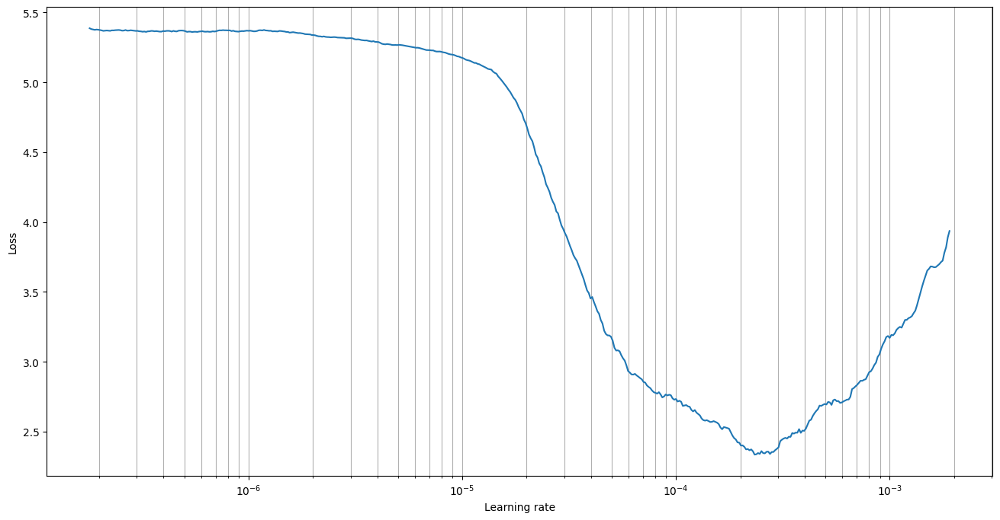

In [59]:
plot_lr_finder(lrs, losses, skip_start = 30, skip_end = 30)

We can then set the learning rates of our model using discriminative fine-tuning - a technique used in transfer learning where later layers in a model have higher learning rates than earlier ones.

We use the learning rate found by the learning rate finder as the maximum learning rate - used in the final layer - whilst the remaining layers have a lower learning rate, gradually decreasing towards the input. 

In [63]:
FOUND_LR = 5*1e-5

params = [
          {'params': model.features.parameters(), 'lr': FOUND_LR / 10},
          {'params': model.classifier.parameters(), 'lr': FOUND_LR / 2}
         ]

optimizer = optim.Adam(params, lr = FOUND_LR)

Next up, we set the learning rate scheduler. A learning rate scheduler dynamically alters the learning rate whilst the model is training. We'll be using the one cycle learning rate scheduler, however [many](https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate) schedulers are available in PyTorch.

The one cycle learning rate scheduler starts with a small initial learning rate which is gradually increased to a maximum value - the value found by our learning rate finder - it then slowly decreases the learning rate to a final value smaller than the initial learning rate. This learning rate is updated after every parameter update step, i.e. after every training batch. For our model, the learning rate for the final `fc` layer throughout training will look like:

![](./../assets/lr-scheduler.png)

As we can see, it starts at slightly less than $1x10^{-4}$ before gradually increasing to the maximum value of $1x10^{-3}$ at around a third of the way through training, then it begins decreasing to almost zero.

The different parameter groups defined by the optimizer for the discriminative fine-tuning will all have their own learning rate curves, each with different starting and maximum values.

The hypothesis is that the initial stage where the learning rate increases is a "warm-up" phase is used to get the model into a generally good area of the loss landscape. The middle of the curve, where the learning rate is at maximum is supposedly good for acting as a regularization method and prevents the model from overfitting or becoming stuck in saddle points. Finally, the "cool-down" phase, where the learning rate decreases, is used to reach small crevices in the loss surface which have a lower loss value.

The one cycle learning rate also cycles the momentum of the optimizer. The momentum is cycled from a maximum value, down to a minimum and then back up to the maximum where it is held constant for the last few steps. The default maximum and minimum values of momentum used by PyTorch's one cycle learning rate scheduler should be sufficient and we will not change them.

To set-up the one cycle learning rate scheduler we need the total number of steps that will occur during training. We simply get this by multiplying the number of epochs with the number of batches in the training iterator, i.e. number of parameter updates. We get the maximum learning rate for each parameter group and pass this to `max_lr`. **Note:** if you only pass a single learning rate and not a list of learning rates then the scheduler will assume this learning rate should be used for all parameters and will **not** do discriminative fine-tuning.

In [69]:
EPOCHS = 10
STEPS_PER_EPOCH = len(train_iterator)
TOTAL_STEPS = EPOCHS * STEPS_PER_EPOCH

MAX_LRS = [p['lr'] for p in optimizer.param_groups]

scheduler = lr_scheduler.OneCycleLR(optimizer,
                                    max_lr = MAX_LRS,
                                    total_steps = TOTAL_STEPS)

One other thing we are going to implement is top-k accuracy. Our task is to classify an image into one of 200 classes of bird, however some of these classes look very similar and it is even difficult for a human to correctly label them. So, maybe we should be more lenient when calculating accuracy? 

One method of solving this is using top-k accuracy, where the prediction is labelled correct if the correct label is in the top-k predictions, instead of just being the first. Our `calculate_topk_accuracy` function calculates the top-1 accuracy as well as the top-k accuracy, with $k=5$ by default.

We use `.reshape` instead of view here as the slices into tensors cause them to become non-contiguous which means `.view` throws an error. As a rule of thumb, if you are aiming to change the size/shape of sliced tensors then you should probably use `.reshape` instead of `.view`.

**Note:** our value of k should be chosen sensibly. If we had a dataset with 10 classes then a k of 5 isn't really that informative.

In [70]:
def calculate_topk_accuracy(y_pred, y, k = 5):
    with torch.no_grad():
        batch_size = y.shape[0]
        _, top_pred = y_pred.topk(k, 1)
        top_pred = top_pred.t()
        correct = top_pred.eq(y.view(1, -1).expand_as(top_pred))
        correct_1 = correct[:1].reshape(-1).float().sum(0, keepdim = True)
        correct_k = correct[:k].reshape(-1).float().sum(0, keepdim = True)
        acc_1 = correct_1 / batch_size
        acc_k = correct_k / batch_size
    return acc_1, acc_k

Next up is the training function. This is similar to all the previous notebooks, but with the addition of the `scheduler` and calculating/returning top-k accuracy.

The scheduler is updated by calling `scheduler.step()`. This should always be called **after** `optimizer.step()` or else the first learning rate of the scheduler will be skipped. 

Not all schedulers need to be called after each training batch, some are only called after each epoch. In that case, the scheduler does not need to be passed to the `train` function and can be called in the main training loop.

In [71]:
def train(model, iterator, optimizer, criterion, scheduler, device):
    epoch_loss = 0
    epoch_acc_1 = 0
    epoch_acc_5 = 0
    model.train()
    
    #for (x, y) in iterator:
    for (x, y) in tqdm(iterator, desc="Training", leave=False):
        x = x.to(device)
        y = y.to(device)
        
        optimizer.zero_grad()
        y_pred = model(x)
        #y_pred, _ = model(x)
        loss = criterion(y_pred, y)
        
        acc_1, acc_5 = calculate_topk_accuracy(y_pred, y)
        
        loss.backward()
        optimizer.step()
        #scheduler.step()
        
        epoch_loss += loss.item()
        epoch_acc_1 += acc_1.item()
        epoch_acc_5 += acc_5.item()
        
    epoch_loss /= len(iterator)
    epoch_acc_1 /= len(iterator)
    epoch_acc_5 /= len(iterator)
        
    return epoch_loss, epoch_acc_1, epoch_acc_5

The evaluation function is also similar to previous notebooks, with the addition of the top-k accuracy.

As the one cycle scheduler should only be called after each parameter update, it is not called here as we do not update parameters whilst evaluating.

In [72]:
def evaluate(model, iterator, criterion, device):
    epoch_loss = 0
    epoch_acc_1 = 0
    epoch_acc_5 = 0
    model.eval()
    
    with torch.no_grad():
        #for (x, y) in iterator:
        for (x, y) in tqdm(iterator, desc="Evaluating", leave=False):
            x = x.to(device)
            y = y.to(device)

            #y_pred, _ = model(x)
            y_pred = model(x)
            loss = criterion(y_pred, y)
            acc_1, acc_5 = calculate_topk_accuracy(y_pred, y)

            epoch_loss += loss.item()
            epoch_acc_1 += acc_1.item()
            epoch_acc_5 += acc_5.item()
        
    epoch_loss /= len(iterator)
    epoch_acc_1 /= len(iterator)
    epoch_acc_5 /= len(iterator)
        
    return epoch_loss, epoch_acc_1, epoch_acc_5

Next, a small helper function which tells us how long an epoch has taken.

In [73]:
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

Finally, we can train our model!

We get around 80% top-1 and 95% top-5 validation accuracy.

In [74]:
best_valid_loss = float('inf')

for epoch in range(EPOCHS):
    start_time = time.monotonic()
    
    scheduler = None
    train_loss, train_acc_1, train_acc_5 = train(model, train_iterator, optimizer, criterion, scheduler, device)
    valid_loss, valid_acc_1, valid_acc_5 = evaluate(model, valid_iterator, criterion, device)
        
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'tut5-model.pt')

    end_time = time.monotonic()
    epoch_mins, epoch_secs = epoch_time(start_time, end_time)
    
    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc @1: {train_acc_1*100:6.2f}% | ' \
          f'Train Acc @5: {train_acc_5*100:6.2f}%')
    print(f'\tValid Loss: {valid_loss:.3f} | Valid Acc @1: {valid_acc_1*100:6.2f}% | ' \
          f'Valid Acc @5: {valid_acc_5*100:6.2f}%')

Epoch: 01 | Epoch Time: 0m 44s
	Train Loss: 5.340 | Train Acc @1:   0.54% | Train Acc @5:   3.17%
	Valid Loss: 5.312 | Valid Acc @1:   0.31% | Valid Acc @5:   3.48%


Epoch: 02 | Epoch Time: 0m 44s
	Train Loss: 5.257 | Train Acc @1:   1.08% | Train Acc @5:   5.14%
	Valid Loss: 5.249 | Valid Acc @1:   0.94% | Valid Acc @5:   4.62%


Epoch: 03 | Epoch Time: 0m 45s
	Train Loss: 5.183 | Train Acc @1:   2.03% | Train Acc @5:   7.90%
	Valid Loss: 5.182 | Valid Acc @1:   2.08% | Valid Acc @5:   7.54%


Epoch: 04 | Epoch Time: 0m 45s
	Train Loss: 5.094 | Train Acc @1:   3.47% | Train Acc @5:  11.47%
	Valid Loss: 5.092 | Valid Acc @1:   3.69% | Valid Acc @5:  10.64%


Epoch: 05 | Epoch Time: 0m 45s
	Train Loss: 4.962 | Train Acc @1:   5.56% | Train Acc @5:  16.50%
	Valid Loss: 4.953 | Valid Acc @1:   5.29% | Valid Acc @5:  16.78%


Epoch: 06 | Epoch Time: 0m 45s
	Train Loss: 4.763 | Train Acc @1:   8.29% | Train Acc @5:  22.97%
	Valid Loss: 4.735 | Valid Acc @1:   8.18% | Valid Acc @5:  21.41%


Epoch: 07 | Epoch Time: 0m 45s
	Train Loss: 4.466 | Train Acc @1:  12.35% | Train Acc @5:  30.83%
	Valid Loss: 4.417 | Valid Acc @1:  11.56% | Valid Acc @5:  29.11%


Epoch: 08 | Epoch Time: 0m 46s
	Train Loss: 4.072 | Train Acc @1:  17.21% | Train Acc @5:  40.00%
	Valid Loss: 4.027 | Valid Acc @1:  14.81% | Valid Acc @5:  37.49%


Epoch: 09 | Epoch Time: 0m 46s
	Train Loss: 3.654 | Train Acc @1:  21.81% | Train Acc @5:  48.65%
	Valid Loss: 3.649 | Valid Acc @1:  20.10% | Valid Acc @5:  45.07%


Epoch: 10 | Epoch Time: 0m 46s
	Train Loss: 3.283 | Train Acc @1:  26.42% | Train Acc @5:  55.58%
	Valid Loss: 3.332 | Valid Acc @1:  24.39% | Valid Acc @5:  51.35%


The test accuracies are a little lower than the validation accuracies, but not by so much that we should be concerned.

In [75]:
model.load_state_dict(torch.load('tut5-model.pt'))

test_loss, test_acc_1, test_acc_5 = evaluate(model, test_iterator, criterion, device)

print(f'Test Loss: {test_loss:.3f} | Test Acc @1: {test_acc_1*100:6.2f}% | ' \
      f'Test Acc @5: {test_acc_5*100:6.2f}%')

Test Loss: 3.339 | Test Acc @1:  23.53% | Test Acc @5:  51.88%


### Examining the Model

We'll be doing the same examinations of the model as done in previous notebooks.

First, we get the predictions for each image in the test set...

In [80]:
def get_predictions(model, iterator):
    model.eval()

    images = []
    labels = []
    probs = []

    with torch.no_grad():
        for (x, y) in iterator:
            x = x.to(device)

            y_pred = model(x)
            #y_pred, _ = model(x)

            y_prob = F.softmax(y_pred, dim = -1)
            top_pred = y_prob.argmax(1, keepdim = True)

            images.append(x.cpu())
            labels.append(y.cpu())
            probs.append(y_prob.cpu())

    images = torch.cat(images, dim = 0)
    labels = torch.cat(labels, dim = 0)
    probs = torch.cat(probs, dim = 0)

    return images, labels, probs

In [81]:
images, labels, probs = get_predictions(model, test_iterator)

... which we then use to get the predicted labels.

In [82]:
pred_labels = torch.argmax(probs, 1)

We then use this to plot a confusion matrix.

A 200x200 confusion matrix is pretty large, so we've increased the figure size and removed the colorbar. The text is still too small to read, but all we care about is that the diagonals are generally darker than the rest of the matrix - which they are.

In [83]:
def plot_confusion_matrix(labels, pred_labels, classes):
    fig = plt.figure(figsize = (50, 50));
    ax = fig.add_subplot(1, 1, 1);
    cm = confusion_matrix(labels, pred_labels);
    cm = ConfusionMatrixDisplay(cm, display_labels = classes);
    cm.plot(values_format = 'd', cmap = 'Blues', ax = ax)
    fig.delaxes(fig.axes[1]) #delete colorbar
    plt.xticks(rotation = 90)
    plt.xlabel('Predicted Label', fontsize = 50)
    plt.ylabel('True Label', fontsize = 50)

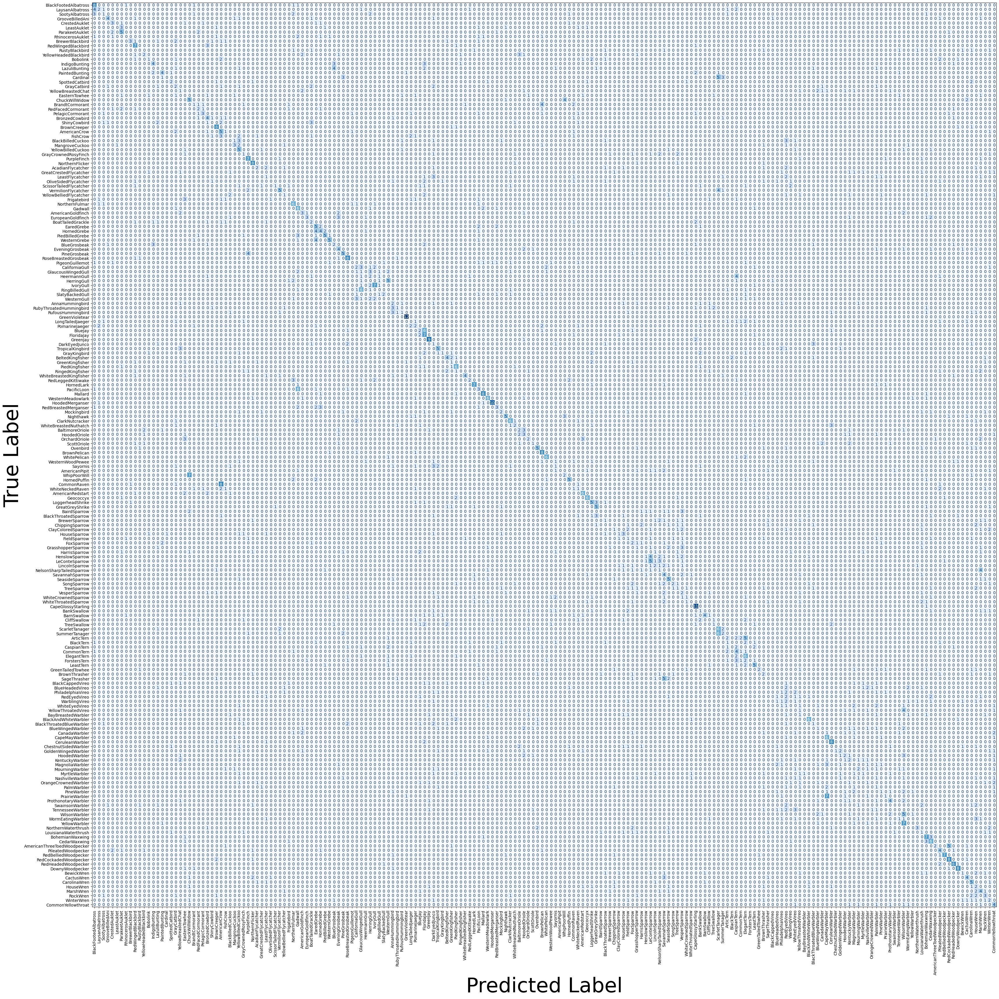

In [84]:
plot_confusion_matrix(labels, pred_labels, classes)

We can then get all of the correct predictions, filter them out, and then sort all of the incorrect predictions based on how confident they were on their incorrect prediction.

In [85]:
corrects = torch.eq(labels, pred_labels)

In [86]:
incorrect_examples = []

for image, label, prob, correct in zip(images, labels, probs, corrects):
    if not correct:
        incorrect_examples.append((image, label, prob))

incorrect_examples.sort(reverse = True, key = lambda x: torch.max(x[2], dim = 0).values)

We can then plot the most incorrectly predicted images along with the predicted class and the actual class. 

In [87]:
def plot_most_incorrect(incorrect, classes, n_images, normalize = True):
    rows = int(np.sqrt(n_images))
    cols = int(np.sqrt(n_images))

    fig = plt.figure(figsize = (25, 20))

    for i in range(rows*cols):
        ax = fig.add_subplot(rows, cols, i+1)
        
        image, true_label, probs = incorrect[i]
        image = image.permute(1, 2, 0)
        true_prob = probs[true_label]
        incorrect_prob, incorrect_label = torch.max(probs, dim = 0)
        true_class = classes[true_label]
        incorrect_class = classes[incorrect_label]

        if normalize:
            image = normalize_image(image)

        ax.imshow(image.cpu().numpy())
        ax.set_title(f'true label: {true_class} ({true_prob:.3f})\n' \
                     f'pred label: {incorrect_class} ({incorrect_prob:.3f})')
        ax.axis('off')
        
    fig.subplots_adjust(hspace=0.4)

From the names of the classes (and a bit of image searching) we can see that the incorrect predictions are usually sensible, e.g. magnolia warbler and cape may warbler, marsh wren and carolina wren.

The most incorrectly predicted image might also be a mislabeled example as worm eating warblers do not have a black and white underside.

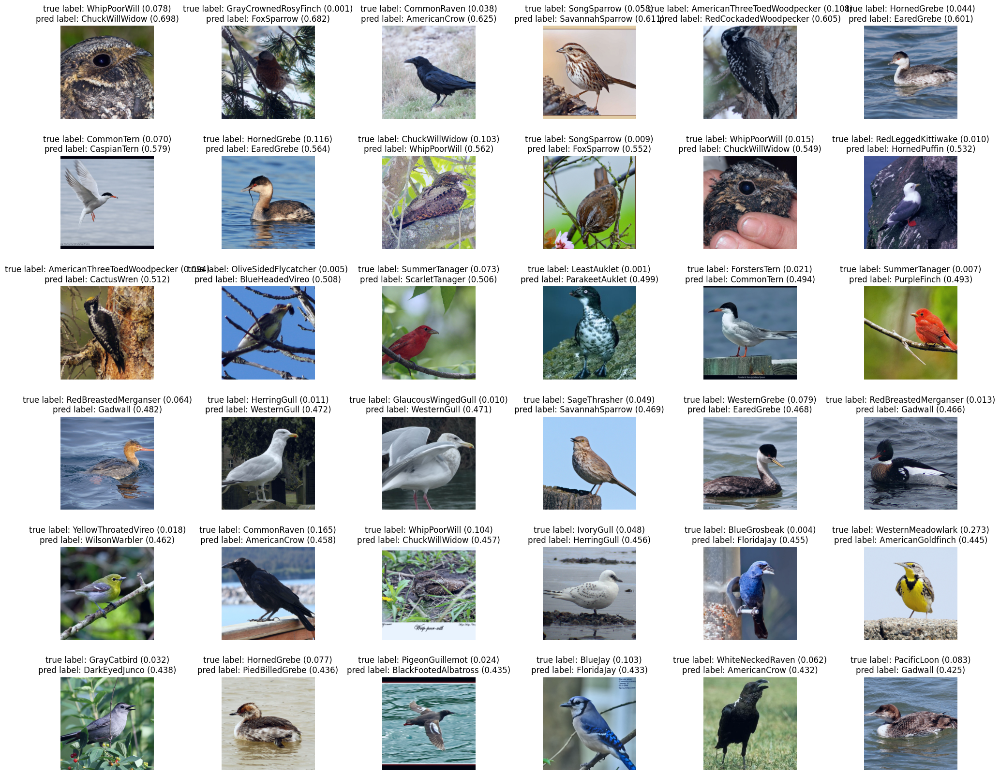

In [88]:
N_IMAGES = 36

plot_most_incorrect(incorrect_examples, classes, N_IMAGES)

We can also get the representations from the model in order to perform some dimensionality reduction techniques.

In this notebook we'll only get the output representations, and not the intermediate ones.

In [91]:
def get_representations(model, iterator):
    model.eval()

    outputs = []
    intermediates = []
    labels = []

    with torch.no_grad():
        #for (x, y) in iterator:
        for (x, y) in tqdm(iterator):
            x = x.to(device)

            y_pred = model(x)
            #y_pred, _ = model(x)

            outputs.append(y_pred.cpu())
            labels.append(y)
        
    outputs = torch.cat(outputs, dim = 0)
    labels = torch.cat(labels, dim = 0)

    return outputs, labels

In [92]:
outputs, labels = get_representations(model, train_iterator)

In [ ]:
import os
 
pid = os.getpid()
!kill -9 $pid

# The old


## I) Summary

**DISCLAIMER**:
- We will use the weights/biases of a pretained model from this [github repository](https://github.com/osmr/imgclsmob/tree/master/pytorch).
- We are only going to implement 1st version of ZFNet.
- We will remove Local Response Normalization.

--- 

- The paper [Visualizing and Understanding Convolutional Networks](https://arxiv.org/abs/1311.2901) introduces the notion of **Deconvnet** which enables us to **visualize
each layer**. 


- By **visualizing each layer**, we can get **more insight** about **what the model is learning** and thus, make some **adjustements** to make it more **optimize**.


- That's how **ZFnet** was created, an **AlexNet fine-tuned version based on visualization results**.

---

ZFNet architecture:

- **5 Convolutional layers**.
- **3 Fully connected layers**.
- **3 Overlapping Max pooling layers**.
- **ReLU** as activation function for hidden layer.
- **Softmax** as activation function for output layer.
- **60,000,000** trainable parameters.
- **Cross-entropy** as cost function
- **Mini-batch gradient descent with Momentum optimizer**.
- **Local Response Normalization** (Removing it seems to give better results)
  
---

ZFNet differences:

- 1st version: 
    - **Conv1** filters: Change from **(11x11 stride 4)** to **(7x7 stride 2)**.
       - By using **ZFNet**, top-5 validation error rate is **16.5%**.
       - By using **AlexNet**, top-5 validation error rate is **18.2%**.


- 2nd version:
    - **Conv2** filters: Use of **512** filters instead of **384**.
    - **Conv4** filters: Use of **1024** filters instead of **384**.
    - **Conv5** filters: Use of **512** filters instead of **256**.
        - By using **ZFnet**, top-5 validation error rate is **16.0%**.
        - By using **AlexNe**t, top-5 validation error rate is **18.2%**.

![legend](./assets/1.png)

![zfnet-model](./assets/2.png)

## a) Architecture build

Define ZFNet version 1.

In [2]:
class ZFNet(nn.Module):
    def __init__(self):
        super(ZFNet, self).__init__()
        # CONV PART.
        self.features = nn.Sequential(OrderedDict([
            ('conv1', nn.Conv2d(3, 96, kernel_size=7, stride=2, padding=1)),
            ('act1', nn.ReLU()),
            ('pool1', nn.MaxPool2d(kernel_size=3, stride=2, padding=1, return_indices=True)),
            ('conv2', nn.Conv2d(96, 256, kernel_size=5, stride=2, padding=0)),
            ('act2', nn.ReLU()),
            ('pool2', nn.MaxPool2d(kernel_size=3, stride=2, padding=1, return_indices=True)),
            ('conv3', nn.Conv2d(256, 384, kernel_size=3, stride=1, padding=1)),
            ('act3', nn.ReLU()),
            ('conv4', nn.Conv2d(384, 384, kernel_size=3, stride=1, padding=1)),
            ('act4', nn.ReLU()),
            ('conv5', nn.Conv2d(384, 256, kernel_size=3, stride=1, padding=1)),
            ('act5', nn.ReLU()),
            ('pool5', nn.MaxPool2d(kernel_size=3, stride=2, padding=0, return_indices=True))
        ]))
    
        self.feature_outputs = [0]*len(self.features)
        self.switch_indices = dict()
        self.sizes = dict()

        self.classifier = nn.Sequential(OrderedDict([
            ('fc6', nn.Linear(9216, 4096)),
            ('act6', nn.ReLU()),
            ('fc7', nn.Linear(4096, 4096)),
            ('act7', nn.ReLU()),
            ('fc8', nn.Linear(4096, 1000))
        ]))
    
        # DECONV PART.
        self.deconv_pool5 = nn.MaxUnpool2d(kernel_size=3,
                                           stride=2,
                                           padding=0)
        self.deconv_act5 = nn.ReLU()
        self.deconv_conv5 = nn.ConvTranspose2d(256,
                                               384,
                                               kernel_size=3,
                                               stride=1,
                                               padding=1,
                                               bias=False)
        
        self.deconv_act4 = nn.ReLU()
        self.deconv_conv4 = nn.ConvTranspose2d(384,
                                               384,
                                               kernel_size=3,
                                               stride=1,
                                               padding=1,
                                               bias=False)
        
        self.deconv_act3 = nn.ReLU()
        self.deconv_conv3 = nn.ConvTranspose2d(384,
                                               256,
                                               kernel_size=3,
                                               stride=1,
                                               padding=1,
                                               bias=False)
        
        self.deconv_pool2 = nn.MaxUnpool2d(kernel_size=3,
                                           stride=2,
                                           padding=1)
        self.deconv_act2 = nn.ReLU()
        self.deconv_conv2 = nn.ConvTranspose2d(256,
                                               96,
                                               kernel_size=5,
                                               stride=2,
                                               padding=0,
                                               bias=False)
        
        self.deconv_pool1 = nn.MaxUnpool2d(kernel_size=3,
                                           stride=2,
                                           padding=1)
        self.deconv_act1 = nn.ReLU()
        self.deconv_conv1 = nn.ConvTranspose2d(96,
                                               3,
                                               kernel_size=7,
                                               stride=2,
                                               padding=1,
                                               bias=False)
        
    def forward(self, x):
        for i, layer in enumerate(self.features):
            if isinstance(layer, nn.MaxPool2d):
                x, indices = layer(x)
                self.feature_outputs[i] = x
                self.switch_indices[i] = indices
            else:
                x = layer(x)
                self.feature_outputs[i] = x
            
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x
    
    def forward_deconv(self, x, layer):
        if (layer < 1) or (layer > 5):
            raise Exception("ZFnet -> forward_deconv(): layer value should be between [1, 5]")
        
        x = self.deconv_pool5(x,
                              self.switch_indices[12],
                              output_size=self.feature_outputs[-2].shape[-2:])
        x = self.deconv_act5(x)
        x = self.deconv_conv5(x)
        
        if layer == 1:
            return x
        
        x = self.deconv_act4(x)
        x = self.deconv_conv4(x)
        
        if layer == 2:
            return x
        
        x = self.deconv_act3(x)
        x = self.deconv_conv3(x)
        
        if layer == 3:
            return x
        
        x = self.deconv_pool2(x,
                              self.switch_indices[5],
                              output_size=self.feature_outputs[4].shape[-2:])
        x = self.deconv_act2(x)
        x = self.deconv_conv2(x)
     
        if layer == 4:
            return x
        
        x = self.deconv_pool1(x,
                              self.switch_indices[2],
                              output_size=self.feature_outputs[1].shape[-2:])
        x = self.deconv_act1(x)
        x = self.deconv_conv1(x)
        
        if layer == 5:
            return x

In [3]:
print("cuda:0" if torch.cuda.is_available() else "cpu")

cuda:0


In [4]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = ZFNet()
#model.cuda()
model.to(device)
summary(model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 96, 110, 110]          14,208
              ReLU-2         [-1, 96, 110, 110]               0
         MaxPool2d-3  [[-1, 96, 55, 55], [-1, 96, 55, 55]]               0
            Conv2d-4          [-1, 256, 26, 26]         614,656
              ReLU-5          [-1, 256, 26, 26]               0
         MaxPool2d-6  [[-1, 256, 13, 13], [-1, 256, 13, 13]]               0
            Conv2d-7          [-1, 384, 13, 13]         885,120
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 384, 13, 13]       1,327,488
             ReLU-10          [-1, 384, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         884,992
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13  [[-1, 256, 6, 6], [-1, 256, 6, 6]]               0
      

Calculate ZFNetV1 parameters.

In [9]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 66,082,696 trainable parameters


## b) Loading pretrained model

The pretrained model was trained on ImageNet-1K dataset over 140 epoch.  
This model obtains a top-1 accuracy 39.79% and a top-5 accuracy 17.27% on the validation set.
To get more information about the training phase, check the [log file](./zfnet.log).

Put `zfnet-1727-d010ddca.pth.zip` file to current directory.

In [5]:
# Download pretrained model.
#urllib.request.urlretrieve('https://github.com/osmr/imgclsmob/releases/download/v0.0.395/zfnet-1727-d010ddca.pth.zip',
#                           'zfnet-1727-d010ddca.pth.zip')

# Unzip 'zfnet-1727-d010ddca.pth.zip'.
with ZipFile('zfnet-1727-d010ddca.pth.zip', 'r') as zip_ref:
    zip_ref.extractall()
    
# Load pretrained model parameters into our model.
load_model('zfnet-1727-d010ddca.pth', model)

# Delete 'zfnet-1727-d010ddca.pth' and 'zfnet-1727-d010ddca.pth.zip'.
os.remove('zfnet-1727-d010ddca.pth')
#os.remove('zfnet-1727-d010ddca.pth.zip')

print(model)

ZFNet(
  (features): Sequential(
    (conv1): Conv2d(3, 96, kernel_size=(7, 7), stride=(2, 2), padding=(1, 1))
    (act1): ReLU()
    (pool1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (conv2): Conv2d(96, 256, kernel_size=(5, 5), stride=(2, 2))
    (act2): ReLU()
    (pool2): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (conv3): Conv2d(256, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (act3): ReLU()
    (conv4): Conv2d(384, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (act4): ReLU()
    (conv5): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (act5): ReLU()
    (pool5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (fc6): Linear(in_features=9216, out_features=4096, bias=True)
    (act6): ReLU()
    (fc7): Linear(in_features=4096, out_features=4096, bias=True)
    (act7): ReLU()
    (fc8): Linear(in_

## c) Testing

Create a dataset.

In [10]:
class CustomDataset(Dataset):
    def __init__(self, transform = None):
        
        self.transform = transform
        self.imgs = []
        self.imgsToDisplay = []
        
        current_dir = os.getcwd()
        image_dir = os.path.join(current_dir, 'img/')
        img_files = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith('.png')]
    
        for img in img_files:
            # Read image.
            img = cv2.imread(img)
            
            self.imgsToDisplay.append(img)
            
            # Apply transformations.
            if self.transform is not None:
                img = self.transform(img)
                
            self.imgs.append(img)
            
    def __getitem__(self, index):    
        return self.imgs[index]
        
    def __len__(self):
        return len(self.imgs)

In [11]:
# Apply preprocessing step on dataset.
transformations = transforms.Compose([transforms.ToPILImage(), 
                                      transforms.CenterCrop(224),
                                      transforms.ToTensor(),
                                      transforms.Normalize(mean = [0.485, 0.456, 0.406],
                                                           std = [0.229, 0.224, 0.225])
                                     ])

custom_dataset = CustomDataset(transform=transformations)
test_loader = DataLoader(dataset=custom_dataset,
                         batch_size=1)

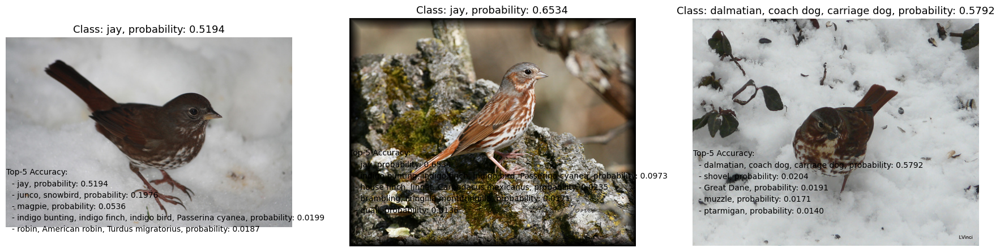

In [12]:
fig2 = plt.figure(figsize=(30,10))

model.eval()
with torch.no_grad():
    for i, image in enumerate(test_loader):
        #image = image.unsqueeze(0)  # 拓展维度, 拓展batch_size那一维
        probs = torch.nn.Softmax(dim=-1)(model(image.to(device)))
        
        probability, class_idx = torch.max(probs, 1)
        class_name = class_names[class_idx]
         
        fig2.add_subplot(1,4,i+1)
        plt.imshow(cv2.cvtColor(custom_dataset.imgsToDisplay[i], cv2.COLOR_BGR2RGB))
        plt.title("Class: " + class_name + ", probability: %.4f" % probability, fontsize=13)
        plt.axis('off')

        plt.text(0, 240, 'Top-5 Accuracy:')
        x, y = 10, 260
        
        for idx in np.argsort(probs.cpu().numpy())[0][-5::][::-1]:
            s = '- {}, probability: {:.4f}'.format(class_names[idx], probs[0, idx])
            plt.text(x, y, s=s, fontsize=10)
            y += 20
        print()

## d) Visualization of each layer

To visualize each layer, we need to reconstruct an approximate version of the picture. 
To do so, we first need to feed our main convnet with an image so that it can record the location of the local max in each pooling region (called switches)

Then, the switches are then used in the unpooling layer to map back pixels to input space.

![legend](./assets/3.png)

Using DeconvNet, here is what the convnet sees at every layer.

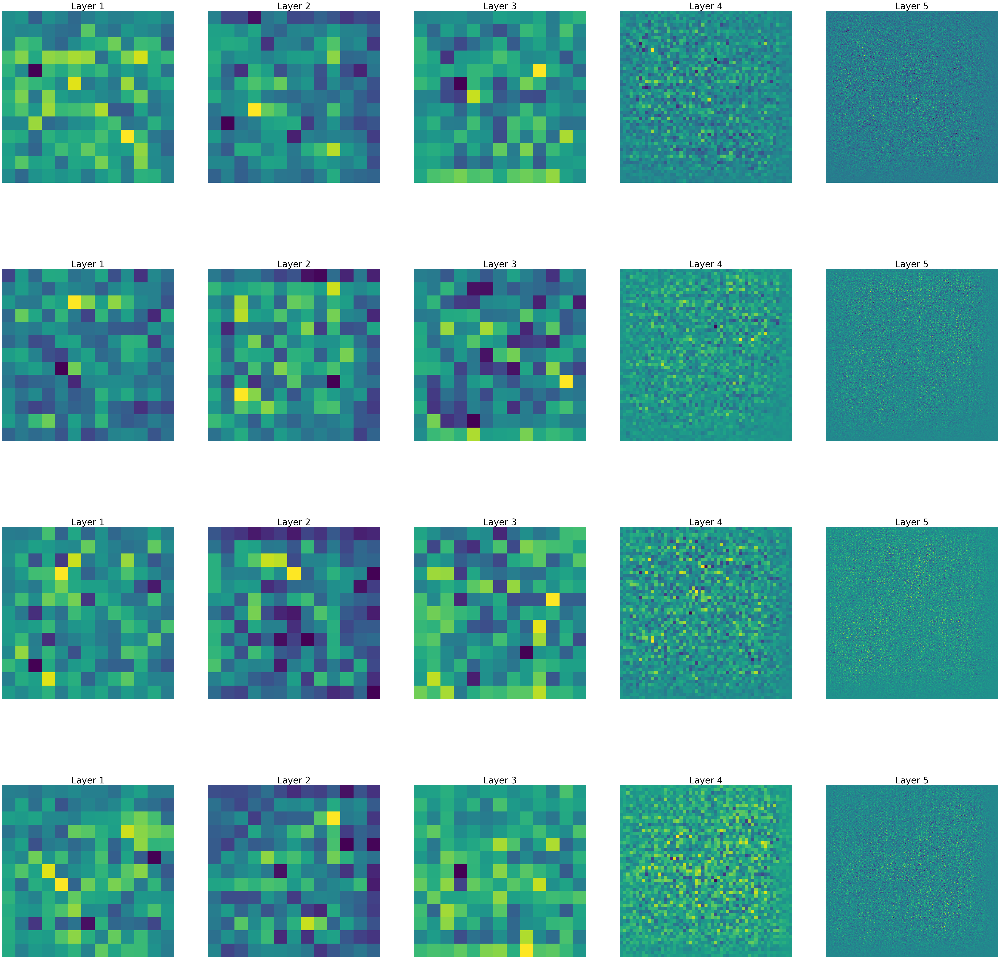

In [10]:
fig2 = plt.figure(figsize=(60,60))

model.eval()
count = 0
with torch.no_grad():
    for i, image in enumerate(test_loader):
        probs = torch.nn.Softmax(dim=-1)(model(image.to(device)))
        for j in range(1,6):
            count += 1
            ax = fig2.add_subplot(4,5, count)
            ax.set_title("Layer {}".format(j), fontsize= 30)
            plt.axis('off')
            # Channel 3 of the image.
            plt.imshow(model.forward_deconv(model.feature_outputs[12], j).detach().cpu().numpy()[0, 2, :])

# End